# DEEBO demo

In [1]:
import random
import numpy as np
import pandas as pd
import sklearn as skl
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib as mpl
from IPython.display import Image
from typing import Dict, Optional, Tuple, Union
from ax import Arm, ChoiceParameter, Models, ParameterType, SearchSpace, SimpleExperiment
from ax.plot.scatter import plot_fitted
from ax.utils.notebook.plotting import render, init_notebook_plotting
from ax.utils.stats.statstools import agresti_coull_sem

In [2]:
mpl.rcParams['figure.dpi'] = 150

In [3]:
def get_results_suzuki(components, short=False, cutoff=None):
    """Get results for selected components.
    e.g., components=['ligand'] returns all results grouped by ligand
    short only chooses normal reactants (reactant 1: aryl halide; reactant 2: bronic acid and boronate)

    :param components: TODO
    :param short:
    :param cutoff:
    :return:
    """
    dic = {
        'ligand': 'Ligand_Short_Hand',
        'reactant1': 'Reactant_1_Name',
        'reactant2': 'Reactant_2_Name',
        'base': 'Reagent_1_Short_Hand',
        'solvent': 'Solvent_1_Short_Hand',
        'yield': 'Product_Yield_PCT_Area_UV',
    }
    small_dic = {
        'reactant1': ['6-chloroquinoline', '6-Bromoquinoline', '6-triflatequinoline', '6-Iodoquinoline'],
        'reactant2': ['2a, Boronic Acid', '2b, Boronic Ester']
    }
    raw = pd.read_csv('../data/suzuki/raw.csv')

    if short:
        raw = raw[raw[dic['reactant1']].isin(small_dic['reactant1'])]
        raw = raw[raw[dic['reactant2']].isin(small_dic['reactant2'])]

    if cutoff is not None:
        if cutoff >= 1 or cutoff <= 0:
            raise ValueError('Yield cutoff out of range (0,1)')
        y = raw[dic['yield']]
        y_max = 100.0 if y.max() < 100.0 else y.max()
        raw[dic['yield']] = (y/y_max) >= cutoff

    for component in components:
        if component == 'solvent':  # clean up mismatched solvent names
            raw.loc[raw[dic['solvent']] == 'MeOH/H2O_V2 9:1', dic['solvent']] = 'MeOH'
            raw.loc[raw[dic['solvent']] == 'THF_V2', dic['solvent']] = 'THF'
        if component not in dic.keys():
            raise ValueError('Reaction component not found.')

    col_names = [dic[component] for component in components]
    cols = col_names + [dic['yield']]  # column name with yield name
    w_yield = raw[cols]
    gb = w_yield.groupby(col_names)
    average = gb.mean()
    results = np.array(gb.apply(lambda x: x.values.tolist()).tolist())[:, :, -1]

    # clean up np array dtype
    if cutoff is not None:
        results = results == 'True'
    else:
        results = results.astype(np.float32)
    keys = list(gb.groups.keys())

    return keys, average, results

In [4]:
def baseline_random(names, results, total_exps=100):  # n=total number of experiments
    sample_n = total_exps//len(names) + 1  # make sure every component is evaluated evenly
    # for every row of results np array, randomly pick n elements

    def f(a):
        index = np.random.choice(results.shape[1], sample_n, replace=False)
        return a[index]

    samples = np.apply_along_axis(f, 1, results)
    return names, sample_n, samples

## Motivations with Suzuki dataset 

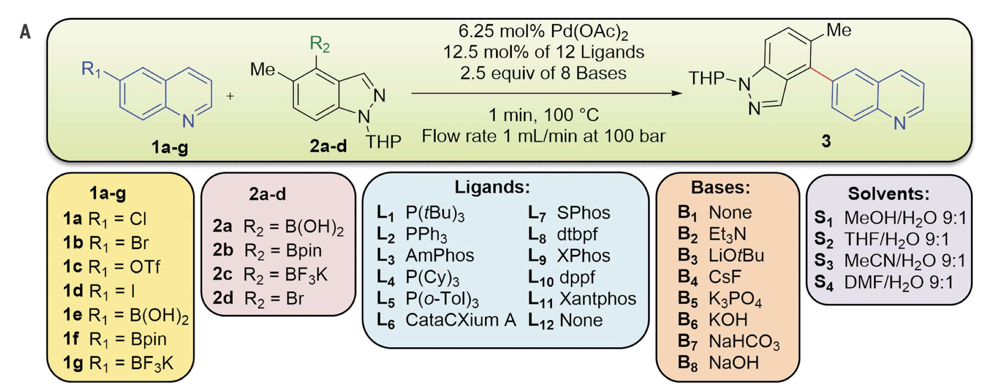

In [5]:
Image('resources/suzuki.png')

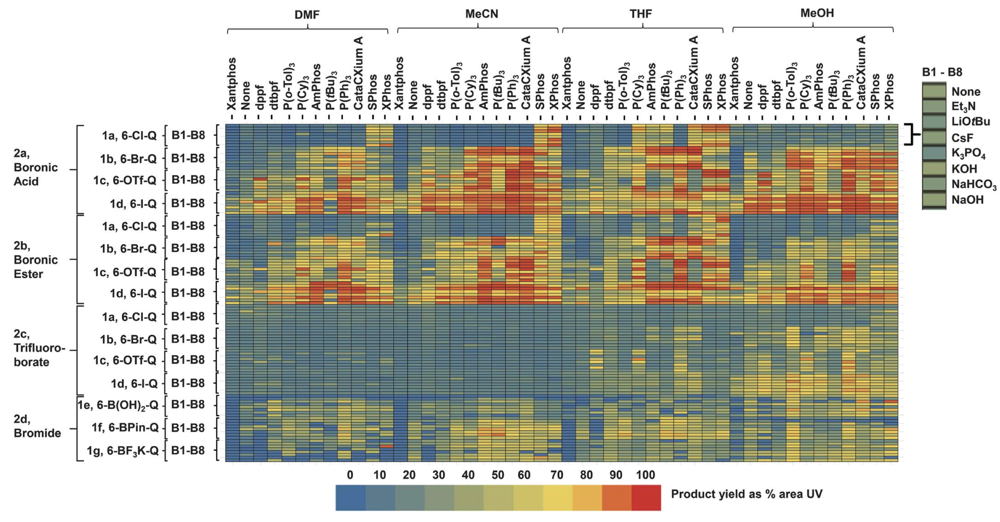

In [6]:
Image('resources/suzuki_result.png', retina=True)

### Only pick "normal" substrates for better distribution

In [7]:
names1, _, results1 = get_results_suzuki(['reactant1'], short=True)
names2, _, results2 = get_results_suzuki(['reactant2'], short=True)
names1

['6-Bromoquinoline',
 '6-Iodoquinoline',
 '6-chloroquinoline',
 '6-triflatequinoline']

In [8]:
names2

['2a, Boronic Acid', '2b, Boronic Ester']

In [9]:
str(results1.size)+' reactions in total'

'3072 reactions in total'

### define a cutoff yield for "successful" experiments 

In [18]:
cutoff = 0.7
names, averages, results = get_results_suzuki(['ligand'], short=True, cutoff=cutoff)
'Cutoff: ' + str(c) + '; Success rate: ' + str(round(np.count_nonzero(results)/results.size, 3))

'Cutoff: 0.7; Success rate: 0.337'

In [19]:
averages  # average success rate for each ligand 

,Product_Yield_PCT_Area_UV
Ligand_Short_Hand,
AmPhos,0.449219
CataCXium A,0.500000
None,0.097656
P(Cy)3,0.484375
P(Ph)3,0.625000
P(o-Tol)3,0.222656
P(tBu)3,0.339844
SPhos,0.500000
XPhos,0.433594


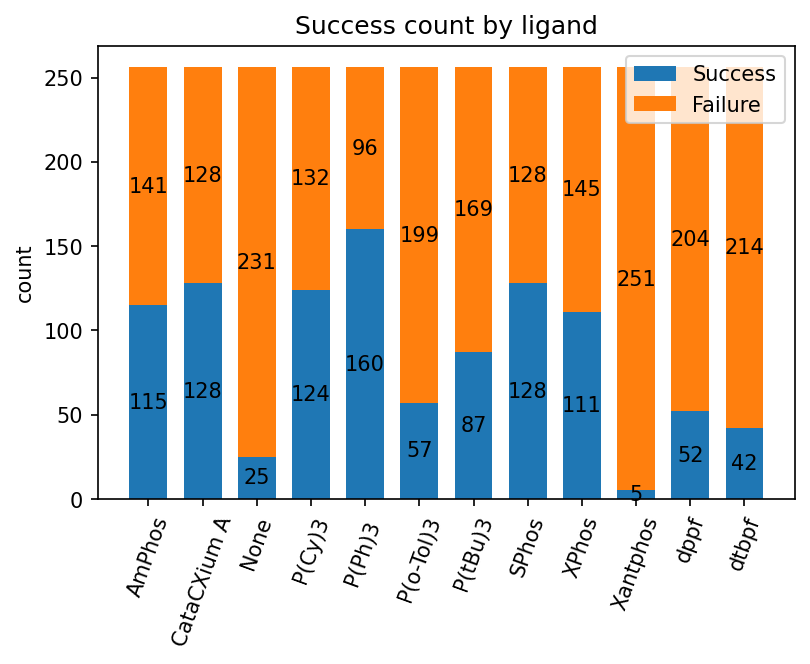

In [17]:
success = np.count_nonzero(results, axis=1)
fail = results.shape[1]-success

N = averages.shape[0]
ind = np.arange(N)
width = 0.7

fig, ax = plt.subplots()
p1 = ax.bar(ind, success, width, label='Success')
p2 = ax.bar(ind, fail, width, bottom=success, label='Failure')
ax.set_ylabel('count')
ax.set_title('Success count by ligand')
ax.set_xticks(ind)
ax.set_xticklabels(names, rotation=70)
ax.legend()
ax.bar_label(p1, label_type='center')
ax.bar_label(p2, label_type='center')
plt.show()

### Find "optimal condition" for this entire reaction space? 

#### <del>How to estimate this distribution with minimal amounts of experiments?
    
#### How to find the optimal arm with minimal amount of experiments?

### First we focus on ligand

plot distribution of yield based on ligand

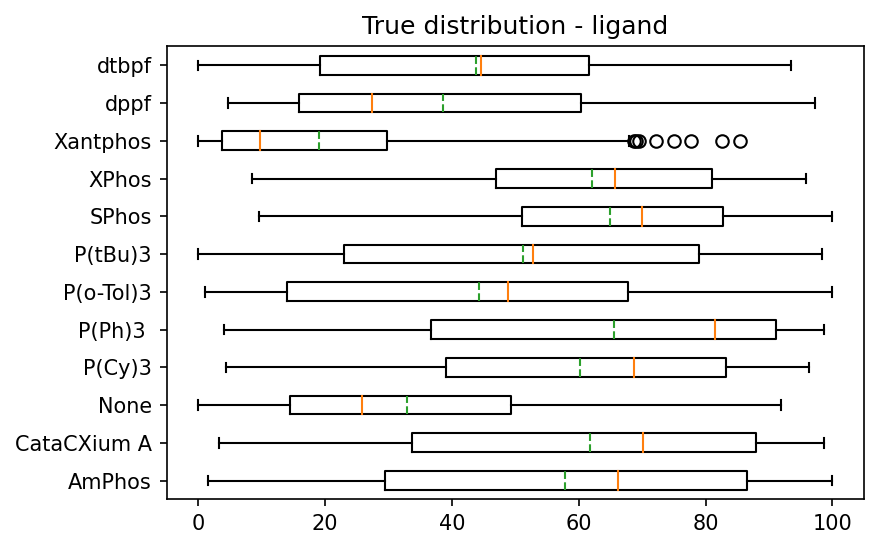

In [54]:
ligand, ligand_average, ligand_result = get_results('ligand', short=True)
plt.boxplot(ligand_result.T, vert=False, labels=ligand, showmeans=True, meanline=True)
plt.title('True distribution - ligand')
plt.show()

There is a difference between different ligand in terms of reactivity. Can we estimate this distribution, and more importantly, the optimal ligand, with a minimal amount of experiments?


An obvious approach would be randomly sample every ligand the same amount of times

Because the low sample size, results vary a lot 

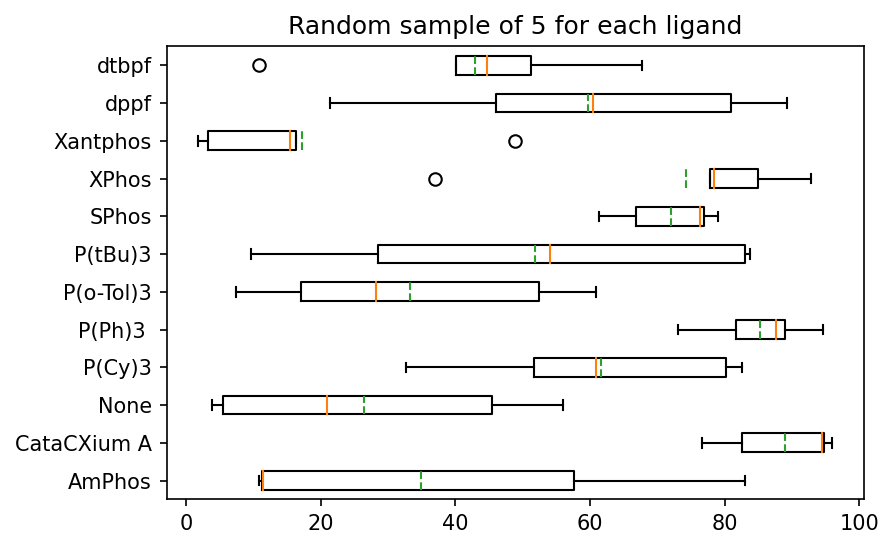

In [73]:
names, sample_n, samples = baseline_random(ligand, ligand_result, 50)
plt.boxplot(samples.T, vert=False, labels=names, showmeans=True, meanline=True)
plt.title('Random sample of '+str(sample_n)+' for each ligand')
plt.show()

In [1]:
# simulate bandit optimization with Suzuki dataset
# using ligand as only parameter, one hot encode, randomly fetch reactivity data
# https://ax.dev/versions/latest/tutorials/factorial.html

init_notebook_plotting()

ligand_names, _, ligand_results = get_results_suzuki(['ligand'], short=True, cutoff=cutoff)

# ['AmPhos', 'CataCXium A', 'None', 'P(Cy)3', 'P(Ph)3 ', 'P(o-Tol)3', 'P(tBu)3', 'SPhos', 'XPhos', 'Xantphos', 'dppf', 'dtbpf']


search_space = SearchSpace(
    parameters=[
        ChoiceParameter(
            name='ligand',
            parameter_type=ParameterType.STRING,
            values=ligand_names,
        )
    ]
)

ohe = skl.preprocessing.OneHotEncoder(categories=[par.values for par in search_space.parameters.values()],
                                      sparse=False)

NameError: name 'init_notebook_plotting' is not defined

In [37]:
def evaluation_function_average(parameterization: Dict[str, Optional[Union[str, bool, float]]], weight: Optional[float] = None):
    batch_size = 12
    noise_level = 0
    weight = weight if weight is not None else 1.0

    features = np.array(list(parameterization.values())).reshape(1, -1)
    encoded_features = np.array(ohe.fit_transform(features))

    # only 1D, select all available results first, then draw samples
    names, _, results = get_results('ligand')
    results = ((results+1)*encoded_features.T)/100
    results = list(results.ravel()[np.flatnonzero(results)])

    # print('')
    # print('results: {0}'.format(results))

    # nn = np.random.binomial(batch_size, weight)
    # n = 1 if nn == 0 else n = nn
    # print('')
    # print('{0} samples drawn'.format(n))

    samples = random.sample(results, 5)
    mean = np.average(samples)
    sem = stats.sem(samples)

    return {'success_metric': (mean, sem)}

[INFO 04-04 23:00:50] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


Running trial 1...
Running trial 2...
Running trial 3...
Running trial 4...
Running trial 5...


In [35]:
# TODO
def evaluation_function_binary(parameterization: Dict[str, Optional[Union[str, bool, float]]], weight: Optional[float] = None):
    batch_size = 12
    noise_level = 0
    weight = weight if weight is not None else 1.0

    features = np.array(list(parameterization.values())).reshape(1, -1)
    encoded_features = np.array(ohe.fit_transform(features))

    # only 1D, select all available results first, then draw samples
    names, _, results = get_results_suzuki(['ligand'], short=True, cutoff=cutoff)
    results = results*encoded_features.T
    print(results)
    exit()
    results = list(results.ravel()[np.flatnonzero(results)])

    print('')
    print('results: {0}'.format(results))

    # nn = np.random.binomial(batch_size, weight)
    # n = 1 if nn == 0 else n = nn
    # print('')
    # print('{0} samples drawn'.format(n))

    samples = random.sample(results, 5)
    mean = np.average(samples)
    sem = stats.sem(samples)

    return {'success_metric': (mean, sem)}

In [36]:
exp = SimpleExperiment(
    name="my_experiment",
    search_space=search_space,
    evaluation_function=evaluation_function_binary,
    objective_name="success_metric",
)

# status_quo_ligand = random.choice(list(ligand_names))
# print('')
# print('status quo ligand: {0}'.format(status_quo_ligand))
# print('')
exp.status_quo = Arm(parameters={"ligand": 'None'})

factorial = Models.FACTORIAL(search_space=exp.search_space)
factorial_run = factorial.gen(n=-1)  # Number of arms to generate is derived from the search space.

trial = (
    exp.new_batch_trial(optimize_for_power=True)
    .add_generator_run(factorial_run, multiplier=1)
)

models = []
for i in range(5):
    print(f"Running trial {i+1}...")
    data = exp.eval_trial(trial)
    thompson = Models.THOMPSON(
        experiment=exp, data=data, min_weight=0.03
    )
    models.append(thompson)
    thompson_run = thompson.gen(n=-1)
    trial = exp.new_batch_trial(optimize_for_power=True).add_generator_run(thompson_run)

Running trial 1...
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

results: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

results: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.

[INFO 04-12 23:27:11] ax.modelbridge.transforms.standardize_y: Outcome success_metric is constant, within tolerance.


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

results: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

results: [1.0, 1.0, 1.0, 1.0, 1.0, 1

[INFO 04-12 23:27:11] ax.modelbridge.transforms.standardize_y: Outcome success_metric is constant, within tolerance.
[INFO 04-12 23:27:11] ax.modelbridge.transforms.standardize_y: Outcome success_metric is constant, within tolerance.


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

results: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Running trial 3...
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

results: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.

[INFO 04-12 23:27:11] ax.modelbridge.transforms.standardize_y: Outcome success_metric is constant, within tolerance.
[INFO 04-12 23:27:11] ax.modelbridge.transforms.standardize_y: Outcome success_metric is constant, within tolerance.


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

results: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Running trial 5...
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

results: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.

In [28]:
render(plot_fitted(models[0], metric="success_metric", rel=False))

In [29]:
render(plot_fitted(models[1], metric="success_metric", rel=False))

In [30]:
render(plot_fitted(models[-1], metric="success_metric", rel=False))

In [31]:
results = pd.DataFrame(
    [
        {"values": ",".join(arm.parameters.values()), "weight": weight}
        for arm, weight in trial.normalized_arm_weights().items()
    ]
)
print(results)

   values  weight
0  AmPhos     0.5
1    None     0.5


In [32]:
from ax.plot.bandit_rollout import plot_bandit_rollout
from ax.utils.notebook.plotting import render

render(plot_bandit_rollout(exp))

In [42]:
from ax.plot.marginal_effects import plot_marginal_effects
render(plot_marginal_effects(models[0], 'success_metric'))